# Introduction to the data

This is a project based on the following dataset:
https://archive.ics.uci.edu/ml/datasets/combined+cycle+power+plant

The data comes from a Combined Cycle Power Plant, which utilises a combination of gas and steam turbines, and a heat recovery steam generator.

The data comes from a period of hourly 2006-2011 measurements when the power plant was at full load.

The data includes:

1.) Ambient Temperature (AT) in degrees Celsius.

2.) Ambient Pressure (AP) in milibar.

3.) Relative Humidity (RH) in %.

4.) Exhaust Vacuum (V) in cm/Hg.

5.) New hourly power output (PE) in MegaWatts.

# Purpose of analysis

The purpose of this analysis is to identify whether the power output (PE) is correlated to the other variables as predictor variables, and whether we can predict the power output using T, AP, RH, and V.

# Performing the analysis

In [1]:
# importing libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
from sklearn.model_selection import train_test_split # splitting the data
from sklearn.linear_model import LinearRegression # this is the model
from sklearn.metrics import r2_score # evaluating the model
from sklearn.metrics import mean_squared_error # evaluating the model
from sklearn.metrics import mean_squared_log_error # evaluating the model

In [2]:
# importing the dataset
df = pd.read_csv("DATA/Folds5x2_pp.csv")

In [3]:
# summarising dataset
df.describe()

,AT,V,AP,RH,PE
count,9568.000000,9568.000000,9568.000000,9568.000000,9568.000000
mean,19.651231,54.305804,1013.259078,73.308978,454.365009
std,7.452473,12.707893,5.938784,14.600269,17.066995
min,1.810000,25.360000,992.890000,25.560000,420.260000
25%,13.510000,41.740000,1009.100000,63.327500,439.750000
50%,20.345000,52.080000,1012.940000,74.975000,451.550000
75%,25.720000,66.540000,1017.260000,84.830000,468.430000
max,37.110000,81.560000,1033.300000,100.160000,495.760000


In [4]:
# checking whether there are any missing values
df.isna().count()

AT    9568
V     9568
AP    9568
RH    9568
PE    9568
dtype: int64

There are no missing values in the dataframe

In [5]:
# list of predictor variables for the net power output (PE)
variables = ["AT", "V", "AP", "RH"]

# list of labels for the corresponding predictor variable
variable_labels = ["Ambient Temperature (Celsius)", 
                   "Exhaust Vacuum (V) in cm/Hg", 
                   "Ambient Pressure (AP) in milibar",
                   "Relative Humidity (RH) in %"]

# loop that automatically plots all the predictor variables against the outcome variable (RE)
for variable, label in zip(variables, variable_labels):
    
    fig = px.scatter(df, x="PE", y=variable, marginal_y="violin", marginal_x="box", trendline="ols", color="PE",
                    labels={"PE" : "Net Hourly Power Output (MW)", variable : label})
    fig.show()

In [6]:
# setting the predictor variables
X = df.drop(['PE'], axis=1).values # removing PE column

# setting the outcome variable
y = df['PE'].values

In [7]:
# splitting the data into a training and test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=0)

In [8]:
# training the model
model = LinearRegression()
model.fit(X_train, y_train)

LinearRegression()

In [9]:
# predict test set results
predictions = model.predict(X_test)
print(predictions)

[433.33404296 448.36262204 445.91904247 ... 474.5913693  463.59555113
 428.08253171]


In [10]:
# evaluating the model using R2-score
r2_score(y_test, predictions)

0.9294064964520519

In [11]:
# evaluating the model using the Root Mean Square Error (RMSE)
mean_squared_error(y_test, predictions)

20.544298877640518

In [12]:
# evaluating the model using the Root Mean Square Log Error (RMSLE)
mean_squared_log_error(y_test, predictions)

9.97003555123875e-05

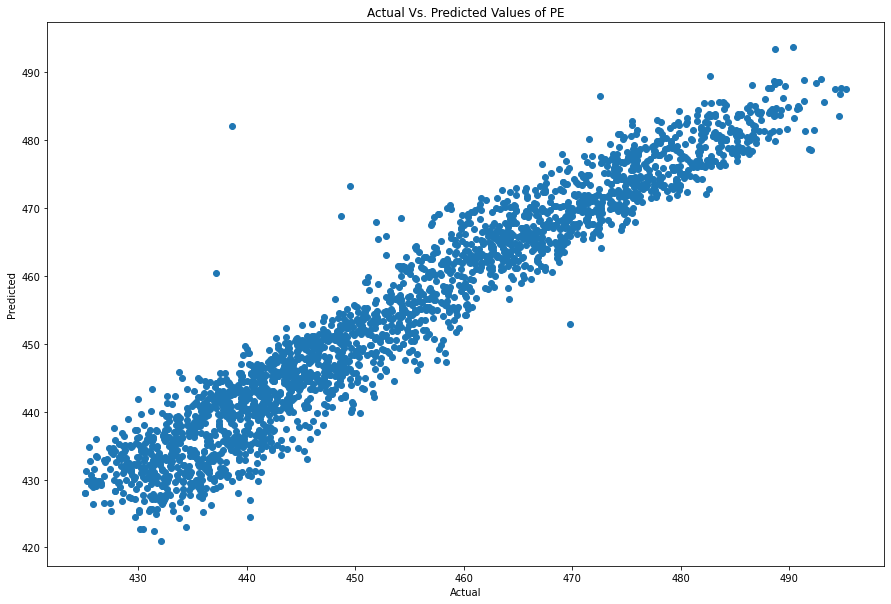

In [13]:
# plotting the results
plt.figure(figsize=(15, 10))
plt.scatter(y_test, predictions)
plt.xlabel("Actual")
plt.ylabel("Predicted")
plt.title("Actual Vs. Predicted Values of PE")
plt.show()

In [14]:
# create same plot except using plotly
fig = px.scatter(x=y_test, y=predictions, marginal_y="violin", marginal_x="box", trendline="ols",
                trendline_color_override="purple", # changing the colour of the line-of-best-fit
                color_discrete_sequence=px.colors.qualitative.Safe, # changing colour theme
                template='plotly_dark', # changing overall plot theme to dark
                labels={'x' : 'Actual Value', 'y' : 'Predicted Value'}) # changing axis labels
fig.show()

In [15]:
# adding predicted values to the original dataset
predicted_df = pd.DataFrame({'Actual Value' : y_test,
                             'Predicted Value' : predictions,
                             'Difference' : (y_test - predictions)})

# displaying the new dataframe
predicted_df

,Actual Value,Predicted Value,Difference
0,426.18,433.334043,-7.154043
1,451.10,448.362622,2.737378
2,442.87,445.919042,-3.049042
3,443.70,445.968740,-2.268740
4,460.59,462.831189,-2.241189
...,...,...,...
2387,436.85,433.631847,3.218153
2388,428.48,426.866361,1.613639
2389,476.83,474.591369,2.238631
2390,461.36,463.595551,-2.235551


In [16]:
# plotting the difference
fig = px.scatter(predicted_df, x="Actual Value", y="Difference",
                 marginal_y="violin",
                 marginal_x="box",
                 trendline="ols",
                 trendline_color_override="purple", # changing the colour of the line-of-best-fit
                 color_discrete_sequence=px.colors.qualitative.Safe, # changing colour theme
                 template='plotly_dark', # changing overall plot theme to dark
                 labels={'x' : 'Actual Value', 'y' : 'Residual'}) # changing axis labels

fig.show()

In [17]:
# checking the assumption for multicollinearity
fig = px.scatter_matrix(df, template='plotly_dark', color_discrete_sequence=px.colors.qualitative.Safe)
fig.show()

# Conclusions

There is a linear relationship between the predictor parameters, and the power output outcome variable. The linear regression model therefore achieves an R2-score of 93%, indicating a strong ability of the predictor variables to predict the output power of the power station.

As displayed in the 'actual value' Vs. 'residual' scatterplot, there is a fairly even distribution of residuals; indicating that this linear models fulfills one of the assumptions of linear regression, which is homoscedasticity.

Another assumption of linear regression is that the recording are independent of each other (no auto-correlation). This is true due to the nature of the data.

Multicollinearity - where two or more independent variables are highly correlated (gradient ~ 1.00). Using the scatter_matrix command for plotly express, this assumption is not broken.

# What have I learnt during this project?

1.) Testing for multicollinearity in Python. This was achieved using the scatter_matrix plot with plotly express.

2.) Checking the distribution of residuals in Python. I achieved this by creating a dataframe that stores the actual values, and the residual value. This was then plotted using plotly express with an Ordinary Least Squares trendline.